# Colab AutoML_Optuna_Hyper_parameter_tunning

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 300)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
#df = pd.read_csv("/content/sample_data/Telco_Customer_Churn.csv")
df = pd.read_csv("Telco_Customer_Churn.csv")

In [3]:
df["TotalCharges"] = pd.to_numeric(df["TotalCharges"], errors='coerce')
df["Churn"] = df["Churn"].apply(lambda x: 1 if x == "Yes" else 0)

In [4]:
def check_df(dataframe, head=5):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    display(dataframe.head(head))
    print("##################### Tail #####################")
    display(dataframe.tail(head))
    print("##################### NA #####################")
    display(dataframe.isnull().sum())
    print("##################### Quantiles #####################")
    #display(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

check_df(df)

##################### Shape #####################
(7043, 21)
##################### Types #####################
customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                 int64
dtype: object
##################### Head #####################


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.850,29.850,0
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.950,1889.500,0
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.850,108.150,1
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.300,1840.750,0
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.700,151.650,1


##################### Tail #####################


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.800,1990.500,0
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.200,7362.900,0
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.600,346.450,0
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.400,306.600,1
7042,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,No,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.650,6844.500,0


##################### NA #####################


customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

##################### Quantiles #####################


In [ ]:
#EDA Library: pandas-profiling

In [ ]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 10.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 14.7 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=2402bafff174b0c081b44e3c46bb1cdcca7b161426c4f17c4fc5b81efd9b08d0
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Pandas Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_notebook_iframe()

In [ ]:
# raporu HTML olarak kaydetmek için
profile.to_file("your_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
ProfileReport(df, minimal=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
sample = df.sample(5000)
profile_sample = ProfileReport(sample, minimal=True)

In [ ]:
from pandas_profiling import ProfileReport, compare
train = df.sample(4000)
test = df.sample(1000)

In [ ]:
train_report = ProfileReport(train, title="Train")
test_report = ProfileReport(test, title="Test")
comparison_report = train_report.compare(test_report)
comparison_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#https://docs.profiling.ydata.ai/latest/

In [ ]:
num_cols = df.drop("customerID", axis=1).select_dtypes(include="number").columns.tolist()
cat_cols = df.drop("customerID", axis=1).select_dtypes(exclude="number").columns.tolist()

In [ ]:
num_cols

In [ ]:
cat_cols

['gender',
 'Partner',
 'Dependents',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod']

In [ ]:
  #AUTO ML LAZY PREDICT

In [ ]:
#https://lazypredict.readthedocs.io/en/latest/

In [ ]:
!pip install lazypredict

In [ ]:
# PLEASE TRY THE SAME LAZYPREDIT  IN JUPYTER NOTEBOOK
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split

df_auto = df.drop("customerID", axis=1)
df_auto = pd.get_dummies(df_auto, drop_first=True)

X = df_auto.drop("Churn", axis=1)
y = df_auto["Churn"]
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)
reg = LazyClassifier(verbose=-99, ignore_warnings=True, custom_metric=None)
models, predictions = reg.fit(X_train, X_test, y_train, y_test)

TypeError: OneHotEncoder.__init__() got an unexpected keyword argument 'sparse'

In [ ]:
models

<function pycaret.classification.functional.models(type: Optional[str] = None, internal: bool = False, raise_errors: bool = True) -> pandas.core.frame.DataFrame>

In [ ]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 485.9/485.9 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 15.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.0/258.0 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.9/21.9 MB 35.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.4 MB

In [ ]:
from pycaret.classification import *

In [ ]:
s = setup(df, target = 'Churn', session_id = 123, ignore_features=["customerID"], train_size=0.7
          ,categorical_features=cat_cols)

,Description,Value
0,Session id,123
1,Target,Churn
2,Target type,Binary
3,Original data shape,"(7043, 21)"
4,Transformed data shape,"(7043, 41)"
5,Transformed train set shape,"(4930, 41)"
6,Transformed test set shape,"(2113, 41)"
7,Ignore features,1
8,Numeric features,4
9,Categorical features,15


In [ ]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8030,0.0000,0.5512,0.6547,0.5981,0.4689,0.4723,1.3780
ada,Ada Boost Classifier,0.8022,0.0000,0.5276,0.6595,0.5849,0.4575,0.4632,0.6940
gbc,Gradient Boosting Classifier,0.8006,0.0000,0.5283,0.6552,0.5839,0.4550,0.4602,1.3660
ridge,Ridge Classifier,0.7994,0.0000,0.5191,0.6555,0.5787,0.4494,0.4552,0.3990
lda,Linear Discriminant Analysis,0.7968,0.0000,0.5543,0.6355,0.5916,0.4572,0.4595,0.3370
lightgbm,Light Gradient Boosting Machine,0.7903,0.0000,0.5330,0.6226,0.5733,0.4356,0.4385,1.3480
rf,Random Forest Classifier,0.7876,0.0000,0.4955,0.6270,0.5524,0.4160,0.4215,0.8230
xgboost,Extreme Gradient Boosting,0.7809,0.0000,0.5276,0.5990,0.5603,0.4154,0.4173,0.8570
et,Extra Trees Classifier,0.7682,0.0000,0.4664,0.5798,0.5159,0.3661,0.3704,0.9010
knn,K Neighbors Classifier,0.7655,0.0000,0.4534,0.5733,0.5059,0.3551,0.3595,0.4430


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
best

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
model = create_model(best)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7890,0.0000,0.5538,0.6102,0.5806,0.4402,0.4411
1,0.7931,0.0000,0.5538,0.6207,0.5854,0.4481,0.4494
2,0.8032,0.0000,0.5649,0.6491,0.6041,0.4740,0.4760
3,0.7992,0.0000,0.5344,0.6481,0.5858,0.4549,0.4586
4,0.7728,0.0000,0.5191,0.5812,0.5484,0.3973,0.3984
5,0.7951,0.0000,0.5496,0.6316,0.5878,0.4523,0.4543
6,0.8195,0.0000,0.5725,0.6944,0.6276,0.5099,0.5141
7,0.8053,0.0000,0.5344,0.6667,0.5932,0.4673,0.4722
8,0.8235,0.0000,0.5725,0.7075,0.6329,0.5185,0.5235


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
predict_model(model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.8055,0.8453,0.5348,0.6667,0.5935,0.4677,0.4726


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,prediction_label,prediction_score
2937,Female,0,Yes,Yes,64,Yes,Yes,Fiber optic,No,Yes,...,No,Yes,One year,Yes,Electronic check,92.85,5980.75,0,0,0.83
3276,Female,0,No,No,4,Yes,No,Fiber optic,No,No,...,No,Yes,Month-to-month,Yes,Electronic check,79.15,317.25,1,1,0.75
4374,Male,0,Yes,Yes,71,Yes,No,No,No internet service,No internet service,...,No internet service,No internet service,Two year,Yes,Bank transfer (automatic),19.60,1387.45,0,0,1.00
4375,Male,0,No,No,66,Yes,Yes,Fiber optic,Yes,Yes,...,Yes,Yes,One year,Yes,Bank transfer (automatic),114.30,7383.70,0,0,0.89
237,Male,0,Yes,No,18,Yes,Yes,Fiber optic,No,No,...,No,No,Month-to-month,Yes,Electronic check,73.15,1305.95,0,1,0.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4496,Female,0,Yes,Yes,72,Yes,Yes,DSL,Yes,Yes,...,Yes,Yes,Two year,No,Credit card (automatic),89.75,6595.90,0,0,0.99
921,Male,0,No,No,12,Yes,No,No,No internet service,No internet service,...,No internet service,No internet service,Month-to-month,No,Mailed check,20.45,255.35,0,0,0.88
5904,Female,0,No,No,70,Yes,Yes,Fiber optic,No,Yes,...,Yes,Yes,One year,No,Electronic check,98.90,6838.60,0,0,0.82
3088,Male,0,Yes,Yes,46,Yes,No,DSL,Yes,No,...,Yes,Yes,Two year,No,Mailed check,81.00,3846.35,0,0,0.98


In [ ]:
# assume we want to finalize lightgbm model

In [ ]:
lgbm = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7972,0.0000,0.6231,0.6136,0.6183,0.4802,0.4802
1,0.7830,0.0000,0.5538,0.5950,0.5737,0.4284,0.4289
2,0.7890,0.0000,0.5344,0.6195,0.5738,0.4346,0.4367
3,0.8053,0.0000,0.5496,0.6606,0.6000,0.4727,0.4762
4,0.7850,0.0000,0.5115,0.6147,0.5583,0.4178,0.4209
5,0.7728,0.0000,0.5115,0.5826,0.5447,0.3942,0.3957
6,0.7972,0.0000,0.5420,0.6396,0.5868,0.4536,0.4563
7,0.8032,0.0000,0.5267,0.6635,0.5872,0.4603,0.4656
8,0.8032,0.0000,0.5573,0.6518,0.6008,0.4713,0.4739


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
tuned_lgbm = tune_model(lgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7931,0.0000,0.5923,0.6111,0.6016,0.4619,0.4620
1,0.7911,0.0000,0.5000,0.6311,0.5579,0.4235,0.4285
2,0.7951,0.0000,0.5115,0.6442,0.5702,0.4380,0.4431
3,0.8134,0.0000,0.5267,0.6970,0.6000,0.4814,0.4894
4,0.7830,0.0000,0.5038,0.6111,0.5523,0.4108,0.4141
5,0.8053,0.0000,0.5573,0.6577,0.6033,0.4754,0.4783
6,0.8215,0.0000,0.5725,0.7009,0.6303,0.5142,0.5188
7,0.8073,0.0000,0.5115,0.6837,0.5852,0.4630,0.4713
8,0.8357,0.0000,0.6107,0.7273,0.6639,0.5563,0.5600


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


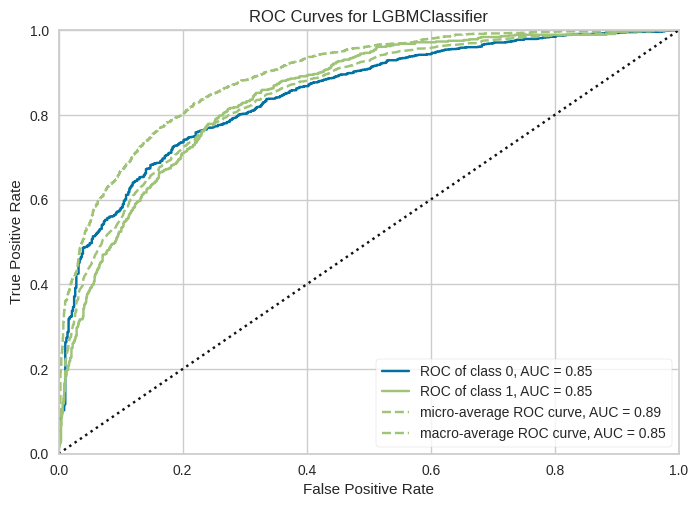

In [ ]:
plot_model(tuned_lgbm, plot = 'auc')

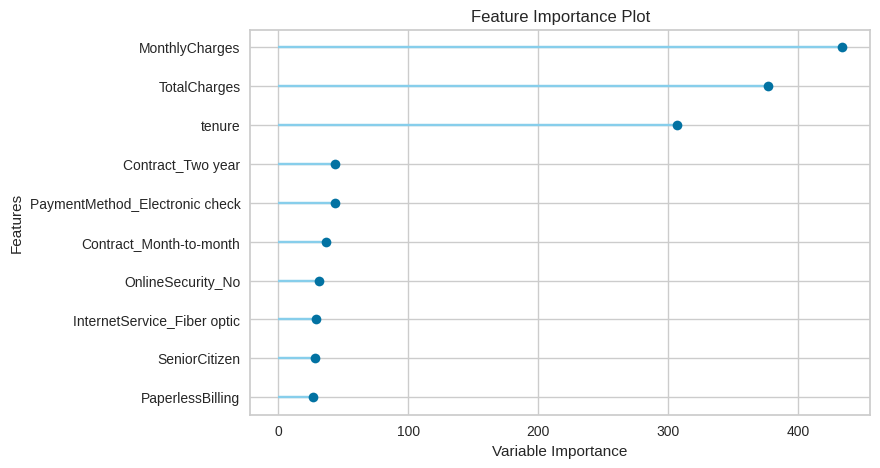

In [ ]:
plot_model(tuned_lgbm, plot = 'feature')

In [ ]:
#hyperparameter tunning

In [ ]:
lgbm_params = {
    "max_depth": np.arange(2, 10),
    "learning_rate": [round(i,2) for i in np.linspace(0.0001, 0.2, num=100)],
    "colsample_bytree": [round(i,2) for i in np.linspace(0.5, 1, num=3)],
    "colsample_bynode": [round(i,2) for i in np.linspace(0.5, 1, num=3)],
    "num_leaves": np.arange(10, 100)
}

tuned_lgbm = tune_model(lgbm, custom_grid=lgbm_params, n_iter=3, fold=3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7908,0.0000,0.5275,0.6250,0.5721,0.4350,0.4377
1,0.7985,0.0000,0.5252,0.6487,0.5805,0.4498,0.4542
2,0.8119,0.0000,0.5092,0.7003,0.5896,0.4716,0.4817
Mean,0.8004,0.0000,0.5206,0.6580,0.5808,0.4521,0.4578
Std,0.0087,0.0000,0.0082,0.0314,0.0071,0.0150,0.0181


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 3 folds for each of 3 candidates, totalling 9 fits


In [ ]:
preds = predict_model(tuned_lgbm, data = df.drop("customerID", axis=1))

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.8143,0.8653,0.5372,0.6938,0.6055,0.4867,0.4935


In [ ]:
preds

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,prediction_label,prediction_score
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,0,1,0.60
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,No,No,One year,No,Mailed check,56.95,1889.50,0,0,0.95
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,0,0.64
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,...,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,0,0,0.95
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,1,0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,...,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,0,0,0.90
7039,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,...,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,0,0,0.90
7040,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,...,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,0,0,0.72
7041,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,...,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,1,1,0.67


In [ ]:
preds["prediction_label"]

0       1
1       0
2       0
3       0
4       1
       ..
7038    0
7039    0
7040    0
7041    1
7042    0
Name: prediction_label, Length: 7043, dtype: int64

In [ ]:
# OPTUNA Hyperparameter tunning

In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 7.8 MB/s eta 0:00:00


In [ ]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,0
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,0
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,0
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1


In [ ]:
num_cols

['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']

In [ ]:
from sklearn.preprocessing import LabelEncoder
df.drop("customerID", axis=1, inplace=True)


In [ ]:
# Label Encoding
def label_encoder(dataframe, binary_col):
    labelencoder = LabelEncoder()
    dataframe[binary_col] = labelencoder.fit_transform(dataframe[binary_col])
    return dataframe

binary_cols = [col for col in df.columns if df[col].dtypes == "O" and df[col].nunique() == 2]
for col in binary_cols:
    df = label_encoder(df, col)

# OHE
cat_cols = [col for col in cat_cols if col not in binary_cols and col not in ["Churn"]]
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

df = one_hot_encoder(df, cat_cols, drop_first=True)
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,29.85,29.85,0,...,False,False,False,False,False,False,False,False,True,False
1,1,0,0,0,34,1,0,56.95,1889.50,0,...,False,False,False,False,False,True,False,False,False,True
2,1,0,0,0,2,1,1,53.85,108.15,1,...,False,False,False,False,False,False,False,False,False,True
3,1,0,0,0,45,0,0,42.30,1840.75,0,...,True,False,False,False,False,True,False,False,False,False
4,0,0,0,0,2,1,1,70.70,151.65,1,...,False,False,False,False,False,False,False,False,True,False


In [ ]:
from sklearn.model_selection import train_test_split
X = df.drop("Churn", axis=1)
y = df["Churn"]
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)

When working on a machine learning project, you need to follow a series of steps until you reach your goal. One of the pivotal steps in this process is hyperparameter optimization, which is executed after you have selected your model. The model selection process involves evaluating various algorithms to identify the best model that outperforms others based on certain performance metrics.

Once the best model is chosen, the next step is to refine it to achieve its optimal performance. This refinement process, known as hyperparameter optimization, is crucial because even the most promising model can fall short of its potential if its hyperparameters are not tuned correctly. It’s an iterative process that involves systematically searching through multiple combinations of hyperparameter values to find the set that results in the best model performance.

hyperparameter optimization is a process of finding the right combination of hyperparameter values in order to achieve maximum performance on the data in a reasonable amount of time. It plays a vital role in the prediction accuracy of a machine learning algorithm. Therefore Hyperparameter optimization is considered the trickiest part of building machine learning models.

Most of these machine learning algorithms come with the default hyperparameter values. The default values do not always perform well on different types of Machine Learning projects you have, that is why you need to optimize them in order to get the right combination that will give you the best performance.

A good choice of hyperparameters can really make an algorithm shine.

(a) Grid Search
This is a widely used traditional method that performs hyperparameter tuning in order to determine the optimal values for a given model. The Grid search works by trying every possible combination of parameters you want to try in your model, this means it will take a lot of time to perform the entire search which can get very computationally expensive.

NB: You can learn how to implement Grid Search here.

(b) Random Search
This method works differently where random combinations of the values of the hyperparameters are used to find the best solution for the built model. The drawback of Random Search is sometimes misses important points(values) in the search space.

Alternative Hyperparameter Optimization Techniques



(1)Optuna
(2)Hyperopt

In [ ]:
#Optuna

In [ ]:
import optuna
from lightgbm import LGBMClassifier
from sklearn.metrics import f1_score

def objective(trial):
    lgbm_params = dict(
    max_depth = trial.suggest_int("max_depth", 3, 20, log=True),
    early_stopping_round = trial.suggest_int("early_stopping_rounds", 10, 40, log=True),
    scale_pos_weight = trial.suggest_float("scale_pos_weight", 2, 15, log=True),
    learning_rate = trial.suggest_float("learning_rate", 0.001, 0.1, log=True),
    num_iterations=1000,
    random_state=41,
    verbosity=-99)

    lgbm_model = LGBMClassifier(**lgbm_params).fit(X_train, y_train, eval_set=(X_test, y_test),
                                                  eval_metric="f1")
    y_pred = lgbm_model.predict(X_test)
    score = f1_score(y_true = y_test, y_pred = y_pred)
    return score

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

[I 2024-04-07 09:58:21,083] A new study created in memory with name: no-name-695834fd-1d23-453f-9bbb-81fcb5e350f4
[I 2024-04-07 09:58:22,165] Trial 0 finished with value: 0.503448275862069 and parameters: {'max_depth': 9, 'early_stopping_rounds': 19, 'scale_pos_weight': 8.71751036736567, 'learning_rate': 0.0016582799346038894}. Best is trial 0 with value: 0.503448275862069.
[I 2024-04-07 09:58:22,270] Trial 1 finished with value: 0.5317725752508361 and parameters: {'max_depth': 3, 'early_stopping_rounds': 27, 'scale_pos_weight': 5.618750698131318, 'learning_rate': 0.007732803084302646}. Best is trial 1 with value: 0.5317725752508361.
[I 2024-04-07 09:58:22,387] Trial 2 finished with value: 0.0 and parameters: {'max_depth': 3, 'early_stopping_rounds': 24, 'scale_pos_weight': 5.959090664372967, 'learning_rate': 0.005850199358328144}. Best is trial 1 with value: 0.5317725752508361.
[I 2024-04-07 09:58:22,687] Trial 3 finished with value: 0.6466666666666666 and parameters: {'max_depth': 4,

In [ ]:
study.best_params

{'max_depth': 12,
 'early_stopping_rounds': 38,
 'scale_pos_weight': 3.3899637085954244,
 'learning_rate': 0.001058143210497579}

In [ ]:
params = study.best_params
params["num_iterations"] = 1000
params["random_state"] = 41
params["verbosity"] = -99
params

{'max_depth': 12,
 'early_stopping_rounds': 38,
 'scale_pos_weight': 3.3899637085954244,
 'learning_rate': 0.001058143210497579,
 'num_iterations': 1000,
 'random_state': 41,
 'verbosity': -99}

In [ ]:
lgb_final = LGBMClassifier(**params).fit(X_train, y_train, eval_set=(X_test, y_test), eval_metric="f1")


In [ ]:
lgb_final.predict(X_test)

array([1, 0, 0, ..., 0, 0, 1])

In [ ]:
#Hyperopt: The Alternative Hyperparameter Optimization Technique

In [ ]:
!pip install hyperopt

In [ ]:
from hyperopt import tpe, hp, fmin, STATUS_OK,Trials
from hyperopt.pyll.base import scope

In [ ]:
#We will use three hyperparameters of the Random Forest algorithm which are
#n_estimators,max_depth, and criterion.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

In [ ]:
space = {
    "n_estimators": hp.choice("n_estimators", [100, 200, 300, 400,500,600]),
    "max_depth": hp.quniform("max_depth", 1, 15,1),
    "criterion": hp.choice("criterion", ["gini", "entropy"]),
}

In [ ]:
# define objective function

def hyperparameter_tuning(params):
    clf = RandomForestClassifier(**params,n_jobs=-1)
    acc = cross_val_score(clf, X, y,scoring="accuracy").mean()
    return {"loss": -acc, "status": STATUS_OK}

In [ ]:
# Initialize trials object
trials = Trials()

best = fmin(
    fn=hyperparameter_tuning,
    space = space,
    algo=tpe.suggest,
    max_evals=100,
    trials=trials
)

print("Best: {}".format(best))

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

ERROR:hyperopt.fmin:job exception: 
All the 5 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1467, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_param_validation.py", line 95, in validate_parameter_constraints
    raise InvalidParameterError(
sklearn.utils._param_validation.InvalidParame

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]


ValueError: 
All the 5 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1467, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_param_validation.py", line 95, in validate_parameter_constraints
    raise InvalidParameterError(
sklearn.utils._param_validation.InvalidParameterError: The 'max_depth' parameter of RandomForestClassifier must be an int in the range [1, inf) or None. Got 9.0 instead.
